### Uber New York - Data Analysis

# List of contents:
- [Introduction](#Introduction)
    - [Checking the number of rows](#Checking-the-number-of-rows)
    - [Detecting duplicated rows, missing values and incorrect data types](#[Detecting-duplicated-rows,-missing-values-and-incorrect-data-types)
    - [Which month have max uber pick-ups?](#Which-month-have-max-uber-pick-ups?)
    - [Analysis of hourly rush](#Analysis-of-hourly-rush)
    - [Which base number has most number of active vehicles?](#Which-base-number-has-most-number-of-active-vehicles?)
    - [Data collection](#Data-collection)
        - [Combination of datasets related to the geographical coordinates of Uber ride requests from different months](#Combination-of-datasets-related-to-the-geographical-coordinates-of-Uber-ride-requests-from-different-months)
    - [Spatial analysis to find rush in uber pick-ups](#Spatial-analysis-to-find-rush-in-uber-pick-ups)
    - [Pair wise analysis to figure out rush](#Pair-wise-analysis-to-figure-out-rush)
    - [Automatization](#Automatization)

# Introduction

This notebook contains an analysis of Uber traffic in New York City, including peak hours and days for ride requests, a visual representation on a map, and an assessment of which partnering company has the most active vehicles.
First dataset contains columns:
- Dispatching_base_num – The unique identifier for the base (dispatching hub) that sent the Uber vehicle to pick up a passenger.
- Pickup_date – The date (and possibly time) when the ride was requested and the passenger was picked up.
- Affiliated_base_num – The unique identifier for the base (company) that the Uber vehicle is affiliated with, indicating which Uber partner company operates the ride.
- LocationID – A numerical identifier representing the geographic area where the pickup occurred, corresponding to predefined zones in New York City.


The second dataset contains:
- dispatching_base_number – The unique identifier for the base (dispatching hub) that is responsible for the active vehicles and trips.
- date – The specific date for which the data on active vehicles and trips is recorded.
- active_vehicles – The number of vehicles that were active (i.e., available and operating) on a given date.
- trips – The number of trips completed by active vehicles on a specific date.

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os
import numpy as np

In [6]:
os.listdir(r"C:\Workspace\udemy_projects\uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [7]:
uber = pd.read_csv(r"C:\Workspace\udemy_projects\uber\Datasets\uber-raw-data-janjune-15_sample.csv")
uber.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-02 21:43:00,B02764,237
1,B02682,2015-01-20 19:52:59,B02682,231
2,B02617,2015-03-19 20:26:00,B02617,161
3,B02764,2015-04-10 17:38:00,B02764,107
4,B02764,2015-03-23 07:03:00,B00111,140


### Checking the number of rows 

In [9]:
uber.shape

(100000, 4)

### Detecting duplicated rows, missing values and incorrect data types

In [11]:
uber.duplicated().sum()

54

In [12]:
uber.drop_duplicates(inplace=True)

In [13]:
uber.shape

(99946, 4)

In [14]:
uber.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [15]:
uber["Pickup_date"] = pd.to_datetime(uber["Pickup_date"])

In [16]:
uber.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [17]:
uber.isnull().sum()

Dispatching_base_num       0
Pickup_date                0
Affiliated_base_num     1116
locationID                 0
dtype: int64

<p font-size:" 18px;"> For now this missing values are irrelevant for performing the analysis as they are connected only to affiliated companies working with uber </p>

# Which month have max uber pick-ups?

In [20]:
uber["Month"] = uber["Pickup_date"].dt.month_name()
monthly_counts = uber["Month"].value_counts().reset_index(name="Count")
print(monthly_counts)

      Month  Count
0      June  19620
1       May  18660
2     April  15982
3     March  15969
4  February  15896
5   January  13819


Text(0.5, 1.0, 'A chart showing the number of Uber rides ordered in successive months.')

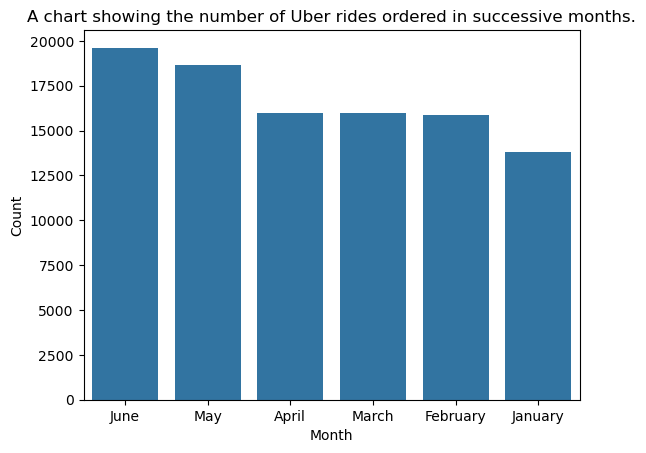

In [21]:
sns.barplot(x="Month",y="Count", data=monthly_counts)
plt.title("A chart showing the number of Uber rides ordered in successive months.")

<p font-size:" 18px;"> It can be seen that June is the month where most pick-ups were made. Let's see this bar again with additional splitting into days. </p>

In [23]:
uber["Day"] = uber["Pickup_date"].dt.day_name()
uber_grp = uber.groupby(["Month", "Day"]).size().reset_index(name="Counts")
uber_grp.pivot(index="Month", columns="Day")

Counts                                                  
Day      Friday Monday Saturday Sunday Thursday Tuesday Wednesday
Month                                                            
April      2365   1833     2508   2052     2823    1880      2521
February   2655   1970     2550   2183     2396    2129      2013
January    2508   1353     2745   1651     2378    1444      1740
June       2793   2848     3037   2485     2767    3187      2503
March      2465   2115     2522   2379     2093    2388      2007
May        3262   1865     3519   2944     2627    2115      2328

Text(0.5, 1.0, 'A chart showing the number of Uber rides ordered in successive months, broken down by days of the week.')

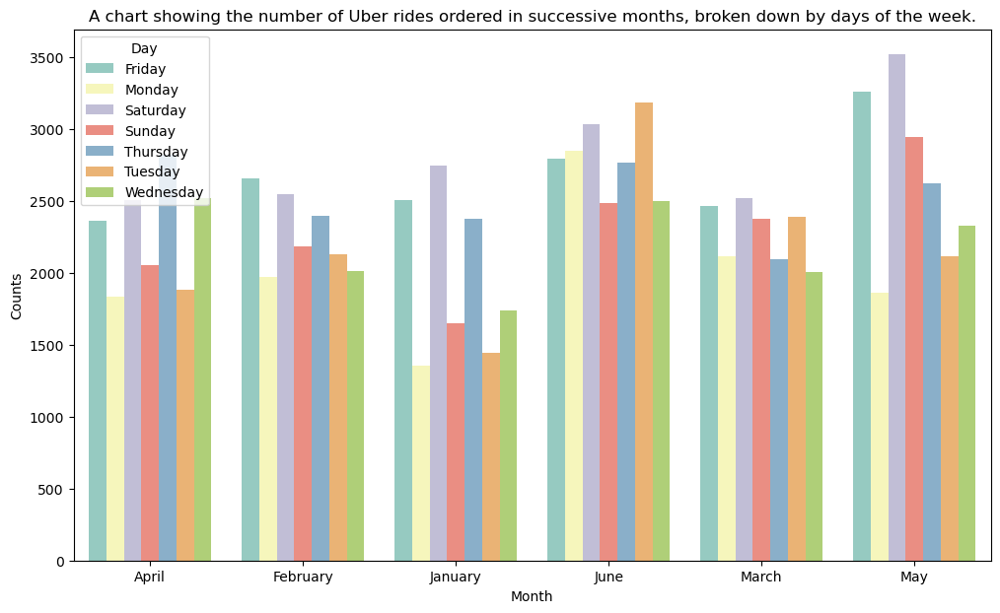

In [24]:
plt.figure(figsize=(12,7))
sns.barplot(x="Month", y="Counts", hue="Day", data=uber_grp, palette="Set3")
plt.title("A chart showing the number of Uber rides ordered in successive months, broken down by days of the week.")

It can be observed that the main trend is that the fewest Uber rides are ordered from Sunday to Wednesday, while the number increases as the weekend approaches. However, in June, the number of Uber rides was high on all days—possibly due to the start of the summer vacation season.

Text(0.5, 1.0, 'The number of Uber rides ordered, broken down by days of June.')

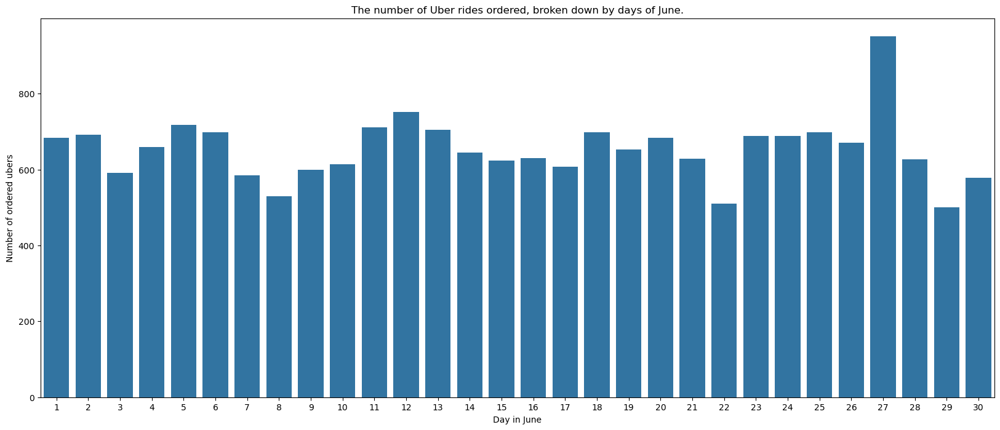

In [26]:
uber["Day_number"]=uber["Pickup_date"].dt.day
june_days = uber[uber["Month"]=="June"]
uber_1 = june_days.groupby(["Day_number"]).size().reset_index(name="count_ubers")
plt.figure(figsize=(20,8))
plt.xlabel("Day in June")
plt.ylabel("Number of ordered ubers")
sns.barplot(data=uber_1, x="Day_number", y="count_ubers")
plt.title("The number of Uber rides ordered, broken down by days of June.")

The first day on the chart is Monday. It can be observed that as the weekend approaches, the number of Uber rides increases (from Thursday to Saturday), specifically on the 4th-6th, 11th-13th, 18th-20th, and 25th-27th.

# Analysis of hourly rush

In [29]:
uber["Hour"] = uber["Pickup_date"].dt.hour
rushly_hours = uber.groupby(["Day", "Hour"]).size().reset_index(name="cars_per_hour")
print(rushly_hours.pivot(index="Hour", columns="Day"))

     cars_per_hour                                                  
Day         Friday Monday Saturday Sunday Thursday Tuesday Wednesday
Hour                                                                
0              581    339     1034   1115      483     342       343
1              333    178      679    887      248     178       232
2              197    109      509    620      181      94       103
3              138    100      356    436      112      62        64
4              161    139      247    290      142     102        97
5              221    238      170    190      183     179       173
6              354    349      191    172      354     328       320
7              547    512      231    193      542     549       543
8              721    684      329    253      695     689       684
9              734    659      419    338      700     702       673
10             548    545      500    444      560     505       495
11             564    493      595

<Axes: xlabel='Hour', ylabel='cars_per_hour'>

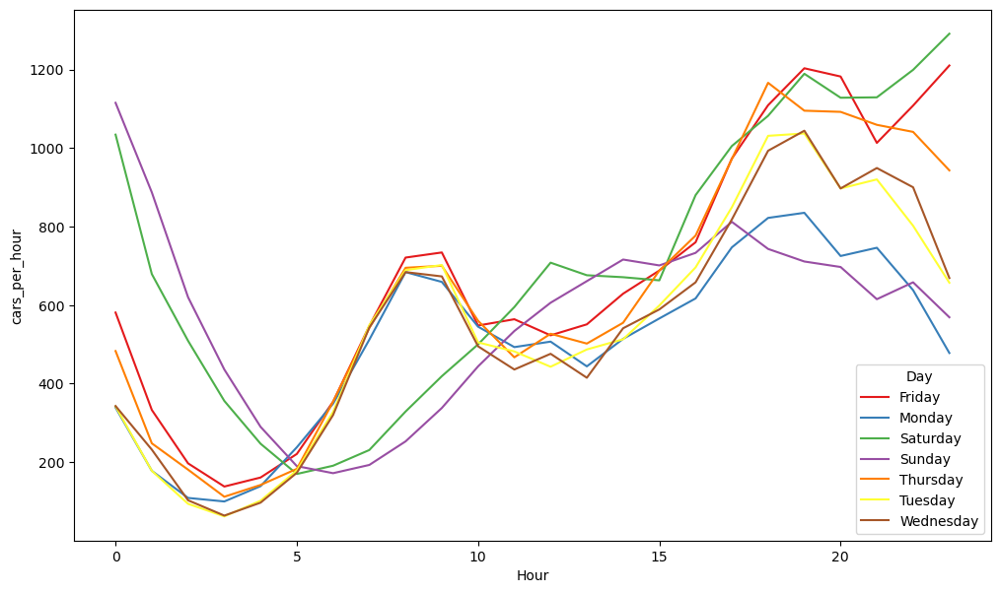

In [30]:
plt.figure(figsize=(12,7))
sns.lineplot(x="Hour", y="cars_per_hour", hue="Day", data=rushly_hours, palette="Set1")

<p font-size:" 18px;"> It can be seen that during week days, ubers are more needed in the morning and then in the afternoon (after work) while on the weekend ubers are needed mainly in the late afternoon till late night hours.  It can be also noticed that most ubers are needed on Thusrsday, Friday and Saturday nights (these three graphs show similar trend). </p>

# Which base number has most number of active vehicles?

In [33]:
os.listdir(r"C:\Workspace\udemy_projects\uber\Datasets")

['other-American_B01362.csv',
 'other-Carmel_B00256.csv',
 'other-Dial7_B00887.csv',
 'other-Diplo_B01196.csv',
 'other-Federal_02216.csv',
 'other-FHV-services_jan-aug-2015.csv',
 'other-Firstclass_B01536.csv',
 'other-Highclass_B01717.csv',
 'other-Lyft_B02510.csv',
 'other-Prestige_B01338.csv',
 'other-Skyline_B00111.csv',
 'Uber-Jan-Feb-FOIL.csv',
 'uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [34]:
foil = pd.read_csv(r"C:\Workspace\udemy_projects\uber\Datasets\Uber-Jan-Feb-FOIL.csv")
foil.head(10)

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537
5,B02598,1/1/2015,870,6903
6,B02598,1/2/2015,785,4768
7,B02617,1/2/2015,1137,7065
8,B02512,1/2/2015,175,875
9,B02682,1/2/2015,890,5506


In [35]:
foil.shape

(354, 4)

In [36]:
foil.describe(include="all")

,dispatching_base_number,date,active_vehicles,trips
count,354,354,354.000000,354.000000
unique,6,59,NaN,NaN
top,B02512,1/1/2015,NaN,NaN
freq,59,6,NaN,NaN
mean,NaN,NaN,1307.435028,11667.316384
std,NaN,NaN,1162.510626,10648.284865
min,NaN,NaN,112.000000,629.000000
25%,NaN,NaN,296.750000,2408.500000
50%,NaN,NaN,1077.000000,9601.000000
75%,NaN,NaN,1417.000000,13711.250000


<Axes: xlabel='dispatching_base_number', ylabel='active_vehicles'>

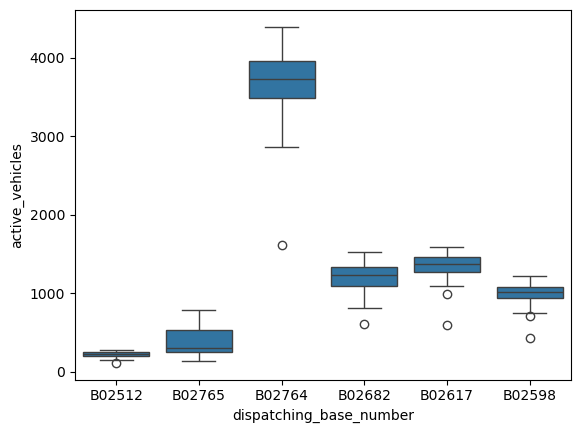

In [37]:
sns.boxplot(x="dispatching_base_number", y="active_vehicles", data=foil)

In [38]:
print(foil["active_vehicles"].max(), ": max number of active vehicles")
foil["active_vehicles"].idxmax()
print(foil.at[260, "dispatching_base_number"], ": Base number which has the biggest number of active vehicles")

4395 : max number of active vehicles
B02764 : Base number which has the biggest number of active vehicles


In [39]:
foil[foil["dispatching_base_number"]=="B02764"].describe()

,active_vehicles,trips
count,59.000000,59.000000
mean,3682.881356,32448.288136
std,438.326444,6788.451621
min,1619.000000,11998.000000
25%,3488.500000,29272.500000
50%,3734.000000,31889.000000
75%,3955.500000,37156.000000
max,4395.000000,45858.000000


## Another, more interactive, way to achieve the result

In [41]:
!pip install chart_studio
!pip install plotly

In [42]:
import chart_studio.plotly as py
import plotly.graph_objs as go
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [43]:
init_notebook_mode(connected=True)

In [44]:
px.box(x="dispatching_base_number", y="active_vehicles", data_frame=foil)

# Data collection

### Combination of datasets related to the geographical coordinates of Uber ride requests from different months.

In [47]:
files = os.listdir(r"C:\Workspace\udemy_projects\uber\Datasets")[-8:]
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-janjune-15_sample.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [48]:
files.remove(files[3])
files.remove(files[2])
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [49]:
final = pd.DataFrame()
for file in files:
    current = pd.read_csv("C://Workspace//udemy_projects//uber//Datasets//"+file)
    final = pd.concat([final, current])
final.shape

(4534327, 4)

In [50]:
final.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


# Spatial analysis to find rush in uber pick-ups

In [52]:
!pip install folium

In [53]:
import folium
from folium.plugins import HeatMap

In [54]:
rush = final.groupby(["Lat", "Lon"], as_index=False).size()
rush

,Lat,Lon,size
0,39.6569,-74.2258,1
1,39.6686,-74.1607,1
2,39.7214,-74.2446,1
3,39.8416,-74.1512,1
4,39.9055,-74.0791,1
...,...,...,...
574553,41.3730,-72.9237,1
574554,41.3737,-73.7988,1
574555,41.5016,-72.8987,1
574556,41.5276,-72.7734,2


In [55]:
basemap = folium.Map()
HeatMap(rush).add_to(basemap)
basemap

# Pair wise analysis to figure out rush

Examine rush on hours and weekdays

In [58]:
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Date/Time  object 
 1   Lat        float64
 2   Lon        float64
 3   Base       object 
dtypes: float64(2), object(2)
memory usage: 173.0+ MB


In [59]:
final.head()

,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512


In [60]:
final["Date/Time"] = pd.to_datetime(final["Date/Time"])
final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4534327 entries, 0 to 1028135
Data columns (total 4 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Date/Time  datetime64[ns]
 1   Lat        float64       
 2   Lon        float64       
 3   Base       object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 173.0+ MB


In [61]:
final["Day"]=final["Date/Time"].dt.day
final["Hour"]=final["Date/Time"].dt.hour
final.head()

,Date/Time,Lat,Lon,Base,Day,Hour
0,2014-04-01 00:11:00,40.7690,-73.9549,B02512,1,0
1,2014-04-01 00:17:00,40.7267,-74.0345,B02512,1,0
2,2014-04-01 00:21:00,40.7316,-73.9873,B02512,1,0
3,2014-04-01 00:28:00,40.7588,-73.9776,B02512,1,0
4,2014-04-01 00:33:00,40.7594,-73.9722,B02512,1,0


In [62]:
final_grp = final.groupby(["Day", "Hour"], as_index=False).size()
final_pvt = final_grp.pivot(index="Day", columns="Hour")
final_pvt.style.background_gradient()

Based on this table, it can be observed on which days and at what times the Uber traffic was highest (the darkest cells).

# Automatization

An example of automating calculations in case the data changes, or if we want to compile different data in a table.

In [66]:
def gen_pivot_table(df, column1, column2):
    final_grp = df.groupby([column1, column2], as_index=False).size()
    final_pvt = final_grp.pivot(index=column1, columns=column2)
    return final_pvt.style.background_gradient()    

In [67]:
gen_pivot_table(final, "Day", "Hour")